<a href="https://colab.research.google.com/github/gstdl/Brazilian_e-Commerce_Exploartory_Data_Analysis_and_Machine_Learning/blob/master/Warehouse_Clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Installing Libraries and Downloading Datasets.
*Please your own kaggle token to download the files on Google Colab*

In [5]:
!pip install geopandas
!pip install --upgrade git+https://github.com/scikit-learn-contrib/hdbscan.git#egg=hdbscan
!pip install kaggle
!mkdir kaggle
import json
token = {"username":"use your own username","key":"use your own key"}
with open('/content/kaggle/kaggle.json','w') as file:
  json.dump(token,file)
!mkdir ../root/.kaggle
!cp /content/kaggle/kaggle.json ~/.kaggle/kaggle.json
!kaggle config set -n path -v{/content}
!chmod 600 /root/.kaggle/kaggle.json
!kaggle datasets download -d gstdl09/brazilian-ecommerce-pickled
!unzip /content/{/content}/datasets/gstdl09/brazilian-ecommerce-pickled/brazilian-ecommerce-pickled.zip

  Cloning https://github.com/scikit-learn-contrib/hdbscan.git to /tmp/pip-install-1vhz5ckw/hdbscan
  Running command git clone -q https://github.com/scikit-learn-contrib/hdbscan.git /tmp/pip-install-1vhz5ckw/hdbscan
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for hdbscan: filename=hdbscan-0.8.23-cp36-cp36m-linux_x86_64.whl size=2360667 sha256=214c1d847e49a6070535480f84b50759b6cdbdea30055634a5be6311cf80a0a9
  Stored in directory: /tmp/pip-ephem-wheel-cache-xjw9mlt6/wheels/be/47/11/458e98e40285ec29eee36df10d017320cf84f1b45eed7ac4b4
Successfully built hdbscan
  Found existing installation: hdbscan 0.8.23
    Uninstalling hdbscan-0.8.23:
      Successfully uninstalled hdbscan-0.8.23


mkdir: cannot create directory ‘kaggle’: File exists
mkdir: cannot create directory ‘../root/.kaggle’: File exists
- path is now set to: {/content}
 89% 74.0M/83.0M [00:00<00:00, 107MB/s] 
100% 83.0M/83.0M [00:00<00:00, 141MB/s]
Archive:  /content/{/content}/datasets/gstdl09/brazilian-ecommerce-pickled/brazilian-ecommerce-pickled.zip
  inflating: gb_geo                  
  inflating: lat_lng.csv             
  inflating: pkl_dfCustomers.csv     
  inflating: pkl_dfGeolocation.csv   
  inflating: pkl_dfItems.csv         
  inflating: pkl_dfMerged.csv        
  inflating: pkl_dfOrders.csv        
  inflating: pkl_dfPayments.csv      
  inflating: pkl_dfProducts.csv      
  inflating: pkl_dfReviews.csv       
  inflating: pkl_dfSellers.csv       


In [0]:
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpt
mpt.rcParams['figure.figsize']=(16,12)
import seaborn as sns
%matplotlib inline

In [0]:
import geopandas as gpd
from sklearn.cluster import KMeans, Birch, AgglomerativeClustering, SpectralClustering, DBSCAN
from hdbscan import HDBSCAN
from time import time

## Data Preparation

In [8]:
dfMerged=pickle.load(open('pkl_dfMerged.csv','rb'))
dfMerged.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,seller_zip_code_prefix,seller_city,seller_state,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,09350,maua,SP,housewares,40.0,268.0,4.0,500.0,19.0,8.0,13.0,7c396fd4830fd04220f754e42b4e5bff,03149,sao paulo,SP,1,credit_card,1,18.12,a54f0611adc9ed256b57ede6b6eb5114,4,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11,2017-10-12 03:43:48
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,09350,maua,SP,housewares,40.0,268.0,4.0,500.0,19.0,8.0,13.0,7c396fd4830fd04220f754e42b4e5bff,03149,sao paulo,SP,3,voucher,1,2.00,a54f0611adc9ed256b57ede6b6eb5114,4,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11,2017-10-12 03:43:48
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,09350,maua,SP,housewares,40.0,268.0,4.0,500.0,19.0,8.0,13.0,7c396fd4830fd04220f754e42b4e5bff,03149,sao paulo,SP,2,voucher,1,18.59,a54f0611adc9ed256b57ede6b6eb5114,4,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11,2017-10-12 03:43:48
3,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,1,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-07-30 03:24:27,118.70,22.76,31570,belo horizonte,SP,perfumery,29.0,178.0,1.0,400.0,19.0,13.0,19.0,af07308b275d755c9edb36a90c618231,47813,barreiras,BA,1,boleto,1,141.46,8d5266042046a06655c8db133d120ba5,4,Muito boa a loja,Muito bom o produto.,2018-08-08,2018-08-08 18:37:50
4,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,1,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,2018-08-13 08:55:23,159.90,19.22,14840,guariba,SP,auto,46.0,232.0,1.0,420.0,24.0,19.0,21.0,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO,1,credit_card,3,179.12,e73b67b67587f7644d5bd1a52deb1b01,5,NaN,NaN,2018-08-18,2018-08-22 19:07:58


In [9]:
dfGeolocation=pickle.load(open('pkl_dfGeolocation.csv','rb'))
dfGeolocation.drop(['cs','frequency_in_dfGeolocation','geometry'],axis=1,inplace=True)
gb_geo = dfGeolocation[dfGeolocation['in_brazil']==1].groupby(['geolocation_zip_code_prefix','geolocation_state','geolocation_city']).mean()

def get_lat(x):
  try:
    return gb_geo.loc[(x[0],x[1],x[2]),'geolocation_lat']
  except:
    return np.nan

def get_lng(x):
  try:
    return gb_geo.loc[(x[0],x[1],x[2]),'geolocation_lng']
  except:
    return np.nan

start=time()
dfMerged['customer_lat']=dfMerged[['customer_zip_code_prefix','customer_state','customer_city']].apply(get_lat,axis=1)
print(f'time elapsed {round(time()-start,3)}s')
start=time()
dfMerged['customer_lng']=dfMerged[['customer_zip_code_prefix','customer_state','customer_city']].apply(get_lng,axis=1)
print(f'time elapsed {round(time()-start,3)}s')
start=time()
dfMerged['seller_lat']=dfMerged[['seller_zip_code_prefix','seller_state','seller_city']].apply(get_lat,axis=1)
print(f'time elapsed {round(time()-start,3)}s')
start=time()
dfMerged['seller_lng']=dfMerged[['seller_zip_code_prefix','seller_state','seller_city']].apply(get_lng,axis=1)
print(f'time elapsed {round(time()-start,3)}s')
start=time()

time elapsed 57.813s
time elapsed 57.164s
time elapsed 56.276s
time elapsed 55.829s


In [10]:
dfMerged.shape

(118315, 43)

In [11]:
lat_lng=pd.concat([dfMerged[[f'{j}_lng',f'{j}_lat']].rename(columns={f'{j}_{i}':i for i in ['lat','lng']}) for j in ['customer','seller']]).dropna()
lat_lng.shape

(233610, 2)

In [0]:
lat_lng.to_csv('lat_lng.csv',index=False)

In [0]:
lat_lng=pd.read_csv('lat_lng.csv',usecols=['lat','lng'])
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
brazil = world[world['name']=='Brazil']

In [14]:
lat_lng.describe()

,lng,lat
count,233610.000000,233610.000000
mean,-46.710460,-22.006084
std,3.349448,4.449747
min,-72.668881,-33.689948
25%,-48.487057,-23.595499
50%,-46.679584,-23.178000
75%,-45.976848,-21.541000
max,-34.799347,3.842508


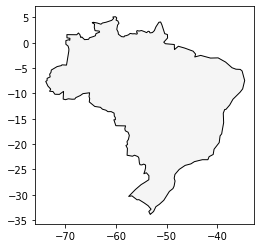

In [0]:
brazil.plot(color='whitesmoke',edgecolor='black')

## Clustering

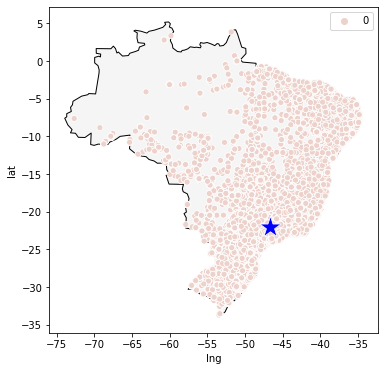

In [0]:
km=KMeans(n_clusters=1)
km.fit(lat_lng)

ax=brazil.plot(color='whitesmoke',edgecolor='black',figsize=(6,6))
sns.scatterplot(lat_lng['lng'],lat_lng['lat'],hue=km.labels_,ax=ax)
sns.scatterplot([i[0] for i in km.cluster_centers_],[i[1] for i in km.cluster_centers_],marker='*',s=500,ax=ax,color='b')
plt.savefig(f'cl_1.jpg')

#### Note
SpectralClustering and AgglomerativeClustering failed due to memory issue, even on Google Colab

#### KMeans and Birch

.... Finished Clustering for 2 warehouses using KMeans
.. Time for clustering = 10.383s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
0    218870
1     14740
dtype: int64
.... Finished Clustering for 2 warehouses using Birch
.. Time for clustering = 20.082s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
0    219341
1     14269
dtype: int64
.... Finished Clustering for 3 warehouses using KMeans
.. Time for clustering = 10.816s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
1    181720
0     37319
2     14571
dtype: int64
.... Finished Clustering for 3 warehouses using Birch
.. Time for clustering = 20.261s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
0    217028
1     14269
2      2313
dtype: int64
.... Finished Clustering for 4 warehouses using KMeans
.. Time for clustering = 11.423s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
3    147793
0     44168
2     27359
1     14290
dtype: int64
.... Finished Clustering for 4 warehouses using Birch
.. Time for clustering = 20.384s
__LABEL

/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 12 warehouses using KMeans
.. Time for clustering = 13.418s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
0     106915
2      29580
6      21781
3      17465
8      14884
9      10782
4       9555
7       7575
1       5800
11      5076
5       3057
10      1140
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 12 warehouses using Birch
.. Time for clustering = 20.322s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
6     139612
1      44450
2      32094
3       6270
5       4521
0       2969
4       1151
9        872
7        509
10       467
8        364
11       331
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 13 warehouses using KMeans
.. Time for clustering = 13.731s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
1     106857
12     28663
0      21779
8      17392
9      14879
6      10693
3       9555
5       7836
4       5780
10      5050
2       3026
7       1428
11       672
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 13 warehouses using Birch
.. Time for clustering = 20.354s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
6     139612
0      44450
2      32094
3       6270
5       4521
12      1570
1       1399
4       1151
9        872
7        509
10       467
8        364
11       331
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 14 warehouses using KMeans
.. Time for clustering = 14.631s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
0     106854
11     27683
7      21779
4      17396
13     14879
6      10638
2       9555
3       8824
1       5053
10      3930
9       2506
5       2465
8       1433
12       615
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 14 warehouses using Birch
.. Time for clustering = 20.485s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
2     139612
13     37505
0      32094
6       6945
3       6270
5       4521
12      1570
1       1399
4       1151
9        872
7        509
10       467
8        364
11       331
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 15 warehouses using KMeans
.. Time for clustering = 15.041s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
0     106850
9      26956
10     21779
4      17298
8      14870
3      10620
6       9555
13      6232
11      5004
14      3929
2       3531
1       2506
7       2458
5       1407
12       615
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 15 warehouses using Birch
.. Time for clustering = 20.573s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
2     139612
13     37505
3      22906
14      9188
6       6945
1       6270
5       4521
12      1570
0       1399
4       1151
9        872
7        509
10       467
8        364
11       331
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 16 warehouses using KMeans
.. Time for clustering = 15.232s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
2     105094
12     22191
0      19760
5      14856
10     13083
6      12374
14      9739
11      9548
8       6807
9       4974
3       4270
1       3929
15      2506
4       2458
7       1410
13       611
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 16 warehouses using Birch
.. Time for clustering = 20.402s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
0     139612
13     37505
3      22906
14      9188
2       6945
1       6270
5       4521
12      1570
4       1151
6       1092
9        872
7        509
10       467
8        364
11       331
15       307
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 17 warehouses using KMeans
.. Time for clustering = 15.981s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
13    83677
12    25968
0     23610
10    21766
2     14850
14    14288
7     10539
5      9552
3      8519
4      5009
6      4929
11     3929
1      2500
16     2406
15     1386
8       379
9       303
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 17 warehouses using Birch
.. Time for clustering = 20.607s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
16    128209
13     37505
1      22906
7      11403
14      9188
2       6945
0       6270
5       4521
12      1570
4       1151
6       1092
9        872
3        509
10       467
8        364
11       331
15       307
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 18 warehouses using KMeans
.. Time for clustering = 16.036s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
2     102367
17     23874
7      21805
1      14576
4      14279
9       9909
5       8681
8       7526
12      6511
10      4968
0       4942
15      3852
14      3310
3       1996
16      1686
11      1364
6       1354
13       610
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 18 warehouses using Birch
.. Time for clustering = 20.506s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
16    128209
13     37505
0      22906
7      11403
14      9188
2       6945
5       4521
17      3487
4       2783
12      1570
1       1151
6       1092
9        872
3        509
10       467
8        364
11       331
15       307
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 19 warehouses using KMeans
.. Time for clustering = 16.358s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
0     83614
3     25241
15    23613
4     21777
10    14796
9     14010
12     9099
6      8500
2      7993
1      4938
18     4914
16     3929
7      3771
8      2481
13     2166
14     1357
5       705
11      403
17      303
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 19 warehouses using Birch
.. Time for clustering = 20.673s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
16    128209
13     37505
18     14958
7      11403
14      9188
8       7948
2       6945
5       4521
17      3487
4       2783
12      1570
0       1151
6       1092
9        872
1        509
10       467
3        364
11       331
15       307
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 20 warehouses using KMeans
.. Time for clustering = 16.291s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
2     83598
19    23486
0     23364
4     21741
9     14575
8     13878
11     8974
3      8227
7      6552
10     4968
14     4923
18     4671
1      3852
17     3763
13     1996
16     1681
15     1366
6      1300
5       403
12      292
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 20 warehouses using Birch
.. Time for clustering = 20.558s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
7     128209
13     37505
18     14958
3      11403
14      9188
8       7948
2       6945
5       4521
17      3487
4       2783
12      1570
6       1092
9        872
16       826
0        509
10       467
1        364
11       331
19       325
15       307
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 21 warehouses using KMeans
.. Time for clustering = 16.863s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
8     83305
0     22797
7     21851
20    17874
2     14317
16     8851
11     8215
19     7850
17     7177
14     6486
5      6441
1      4983
6      4552
18     4356
9      3852
3      3662
15     1996
13     1686
12     1395
4      1354
10      610
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 21 warehouses using Birch
.. Time for clustering = 20.508s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
7     128209
13     37505
18     14958
3      11403
14      9188
8       7948
0       6945
2       4521
17      3487
4       2783
12      1570
6       1092
9        872
16       826
10       467
1        364
5        331
19       325
20       314
15       307
11       195
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 22 warehouses using KMeans
.. Time for clustering = 18.176s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
1     83391
21    21939
8     21396
13    18631
9     14151
0     13405
16    10243
6      8899
3      7817
10     5971
5      4315
18     4109
12     3779
17     3468
4      3395
2      1994
20     1681
15     1652
14     1401
19     1300
7       381
11      292
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 22 warehouses using Birch
.. Time for clustering = 20.604s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
7     128209
13     37505
18     14958
3      11403
14      9188
8       7948
21      5466
0       4521
17      3487
4       2783
12      1570
5       1479
6       1092
9        872
16       826
10       467
1        364
2        331
19       325
20       314
15       307
11       195
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 23 warehouses using KMeans
.. Time for clustering = 18.346s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
2     83325
15    22733
5     21396
16    17821
8     13364
13     9143
0      7362
18     7083
21     7052
7      6432
9      5624
22     5488
14     4306
19     4209
10     3779
3      3280
17     2700
4      1994
20     1686
1      1547
11     1358
12     1322
6       606
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 23 warehouses using Birch
.. Time for clustering = 20.728s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
7     128209
6      37505
18     14958
3      11403
14      9188
8       7948
21      5466
13      3932
17      3487
4       2783
12      1570
5       1479
2       1092
9        872
16       826
22       589
10       467
1        364
0        331
19       325
20       314
15       307
11       195
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 24 warehouses using KMeans
.. Time for clustering = 18.814s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
15    83563
9     24638
3     23463
5     21395
1     14272
0      8865
12     8591
8      6999
17     6494
7      5994
6      4315
13     4123
10     3781
22     3204
21     2626
16     2362
2      2000
23     1648
14     1636
4      1309
20     1019
11      645
19      376
18      292
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 24 warehouses using Birch
.. Time for clustering = 20.738s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
7     128209
6      37505
18     14958
3      11403
14      9188
8       7948
21      5466
13      3932
17      3487
1       2783
12      1570
5       1479
2       1092
4        872
16       826
22       589
10       467
0        364
19       325
20       314
15       307
9        223
11       195
23       108
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 25 warehouses using KMeans
.. Time for clustering = 19.991s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
1     83305
19    22787
8     21395
7     17868
4     14252
10     8780
11     8157
3      7023
24     7014
18     6028
0      4421
6      4313
15     4238
13     4181
12     3779
21     3373
20     2605
2      1994
14     1680
17     1658
23     1540
9      1300
22     1251
5       376
16      292
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 25 warehouses using Birch
.. Time for clustering = 20.792s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
7     128209
6      37505
18     14958
3      11403
14      9188
8       7948
21      5466
13      3932
17      3487
1       2783
5       1570
2       1479
0       1092
4        872
16       826
22       589
10       467
12       361
19       325
20       314
15       307
9        223
11       195
23       108
24         3
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 26 warehouses using KMeans
.. Time for clustering = 19.652s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
1     82572
23    21166
7     20831
16    17641
19    12426
10     8802
8      7389
3      7083
4      6942
9      6139
24     5968
0      5207
21     4352
25     4301
13     4022
2      3781
18     3280
14     2700
12     2000
6      1632
11     1629
15     1311
22     1142
20      626
5       376
17      292
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 26 warehouses using Birch
.. Time for clustering = 20.75s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
7     128209
6      37505
18     14958
3      11403
14      9188
8       7948
21      5466
13      3932
17      3487
0       2783
5       1570
2       1479
1        872
16       826
22       816
10       589
4        467
12       361
19       325
20       314
15       307
25       276
9        223
11       195
23       108
24         3
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 27 warehouses using KMeans
.. Time for clustering = 19.106s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
0     82465
20    20972
9     20811
15    18468
4     12454
3      8821
19     8711
2      8208
14     7143
5      6424
8      5828
24     4912
10     4030
25     3989
11     3720
13     3276
17     3242
16     1656
18     1624
21     1601
12     1212
7      1142
22      862
1       762
26      609
6       376
23      292
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 27 warehouses using Birch
.. Time for clustering = 20.816s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
7     128209
2      37505
18     14958
3      11403
6       9188
8       7948
21      5466
13      3932
17      3487
5       1570
0       1479
14      1400
26      1383
1        872
16       826
22       816
10       589
4        467
12       361
19       325
20       314
15       307
25       276
9        223
11       195
23       108
24         3
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 28 warehouses using KMeans
.. Time for clustering = 20.27s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
23    78623
18    21270
3     20613
22    14881
15    12841
19     8959
27     8573
0      7473
2      7372
4      7017
7      6405
12     6267
13     5852
11     4296
17     4025
6      3783
16     2267
24     2046
1      2003
20     1632
8      1629
26     1303
10     1210
9      1142
25      834
5       626
14      376
21      292
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 28 warehouses using Birch
.. Time for clustering = 20.83s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
7     128209
2      37505
18     14958
3      11403
6       9188
8       7948
21      5466
13      3932
17      3487
5       1570
14      1400
26      1383
20       950
0        872
16       826
22       816
10       589
27       529
1        467
12       361
19       325
9        314
15       307
25       276
4        223
11       195
23       108
24         3
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 29 warehouses using KMeans
.. Time for clustering = 20.292s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
0     82442
9     20811
25    20668
5     12422
16    12213
27     8725
15     8649
10     7567
3      7019
11     6423
2      6321
8      5879
22     4907
4      4242
17     4022
12     3839
21     3058
14     2960
1      1861
28     1688
19     1629
6      1212
7      1134
26     1090
24      845
23      708
18      608
13      376
20      292
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 29 warehouses using Birch
.. Time for clustering = 20.838s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
3     128209
2      37505
18     14958
1      11403
6       9188
8       7948
21      5466
13      3932
17      3487
5       1570
14      1400
26      1383
20       950
7        826
22       816
28       612
10       589
27       529
0        467
12       361
19       325
9        314
15       307
25       276
16       260
4        223
11       195
23       108
24         3
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 30 warehouses using KMeans
.. Time for clustering = 21.217s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
4     82465
20    20948
3     20811
15    14849
8     12449
26     8674
0      8646
10     6998
18     6495
6      5854
11     5615
22     5060
28     4900
5      4186
16     3938
13     3793
25     3235
17     2485
2      2295
9      1868
23     1349
7      1211
21     1075
14      992
27      839
1       715
24      613
29      577
12      376
19      299
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 30 warehouses using Birch
.. Time for clustering = 20.98s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
3     128209
0      37505
18     14958
1      11403
2       9188
8       7948
21      5466
13      3932
17      3487
5       1570
14      1400
26      1383
20       950
7        826
22       816
28       612
10       589
27       529
12       361
19       325
9        314
15       307
25       276
16       260
6        236
29       231
4        223
11       195
23       108
24         3
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 31 warehouses using KMeans
.. Time for clustering = 22.055s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
0     82442
4     20811
25    20668
21    12421
13    12154
20     8940
3      8679
15     7589
5      7023
26     6279
12     5661
19     4953
29     3978
16     3891
28     3868
11     3846
8      3435
30     2874
9      2401
7      1964
27     1658
1      1621
10     1504
6      1177
23      984
24      812
2       693
22      492
17      375
18      225
14      192
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 31 warehouses using Birch
.. Time for clustering = 21.115s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
3     128209
14     33915
18     14958
1      11403
0       9188
8       7948
21      5466
13      3932
30      3590
17      3487
5       1570
6       1400
26      1383
20       950
7        826
22       816
28       612
10       589
27       529
12       361
19       325
9        314
15       307
25       276
16       260
2        236
29       231
4        223
11       195
23       108
24         3
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 32 warehouses using KMeans
.. Time for clustering = 21.747s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
12    82465
8     20938
5     20811
26    14201
24    12417
9      8877
25     8639
6      7019
19     6375
20     6165
1      4895
28     3946
29     3878
23     3567
2      3446
0      2935
21     2915
4      2827
16     2423
10     2406
17     1744
30     1688
18     1647
15     1342
7      1225
14     1177
13     1007
31      800
22      590
3       578
11      375
27      292
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 32 warehouses using Birch
.. Time for clustering = 20.848s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
1     128209
14     33915
18     14958
0      11403
7       8044
8       7948
21      5466
13      3932
30      3590
17      3487
5       1570
6       1400
26      1383
31      1144
20       950
3        826
22       816
28       612
10       589
27       529
12       361
19       325
9        314
15       307
25       276
16       260
2        236
29       231
4        223
11       195
23       108
24         3
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 33 warehouses using KMeans
.. Time for clustering = 21.304s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
2     82442
4     20811
20    20668
13    12422
6     12137
24     8901
28     8718
25     7306
8      6975
29     6279
0      5546
31     4907
12     4020
22     3797
5      3602
10     3116
1      2874
26     2404
9      2262
16     2046
17     1790
21     1597
32     1465
23     1303
15     1178
27     1072
14      954
18      796
3       703
11      487
7       375
30      358
19      299
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 33 warehouses using Birch
.. Time for clustering = 21.112s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
0     128209
14     33915
18     14958
32      9095
3       8044
8       7948
21      5466
13      3932
30      3590
17      3487
16      2308
5       1570
6       1400
26      1383
31      1144
20       950
1        826
22       816
28       612
10       589
27       529
12       361
19       325
9        314
15       307
25       276
7        260
2        236
29       231
4        223
11       195
23       108
24         3
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 34 warehouses using KMeans
.. Time for clustering = 21.436s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
1     78442
21    20888
6     19087
7     12117
3     10964
19     8697
25     7546
0      7293
14     6956
13     6626
33     6237
29     6077
15     5584
11     3716
9      3689
27     3602
28     3375
18     3014
26     2992
32     2421
4      2186
16     1624
24     1601
23     1322
17     1158
31     1021
22     1012
20      982
2       760
30      746
5       611
10      597
12      375
8       292
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 34 warehouses using Birch
.. Time for clustering = 21.015s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
16    108943
14     33915
22     19266
18     14958
32      9095
3       8044
8       7948
21      5466
13      3932
30      3590
17      3487
33      2308
5       1570
6       1400
26      1383
31      1144
20       950
0        826
10       816
28       612
4        589
27       529
12       361
19       325
9        314
15       307
25       276
7        260
2        236
29       231
1        223
11       195
23       108
24         3
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 35 warehouses using KMeans
.. Time for clustering = 21.343s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
33    79640
0     20770
3     15992
11    12425
1     12245
16     8918
30     8625
27     7430
8      7306
9      6975
31     6271
4      5546
23     4931
24     3857
25     3625
15     3524
22     3120
21     2874
7      2412
34     2262
18     2046
2      1656
20     1604
29     1303
5      1157
19     1102
14     1084
12     1007
17      788
26      779
32      672
10      594
13      426
28      360
6       284
dtype: int64


/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:503: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


.... Finished Clustering for 35 warehouses using Birch
.. Time for clustering = 21.191s
__LABELS AND MEMBER QUANTITY IN EACH CLUSTER__
16    108943
14     33915
22     19266
18     14958
32      9095
3       8044
8       7948
21      5466
6       3932
30      3590
17      3487
33      2308
5       1570
2       1400
26      1383
31      1144
20       950
10       816
13       669
28       612
4        589
27       529
12       361
19       325
9        314
15       307
25       276
7        260
0        236
29       231
1        223
11       195
34       157
23       108
24         3
dtype: int64


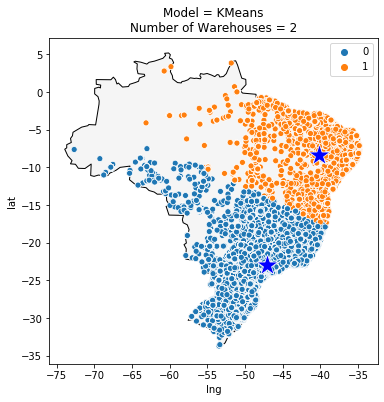

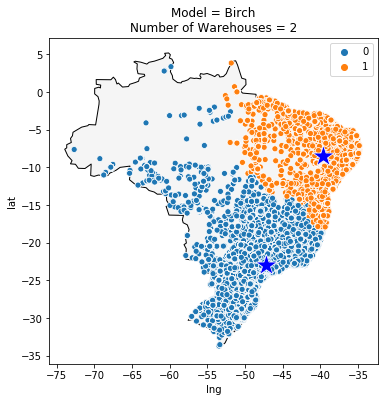

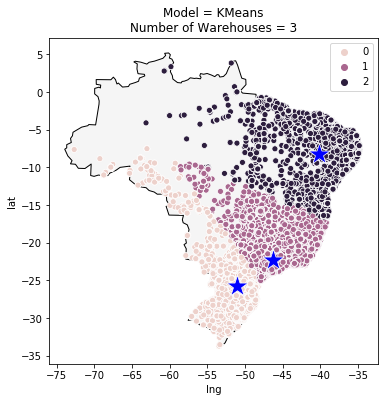

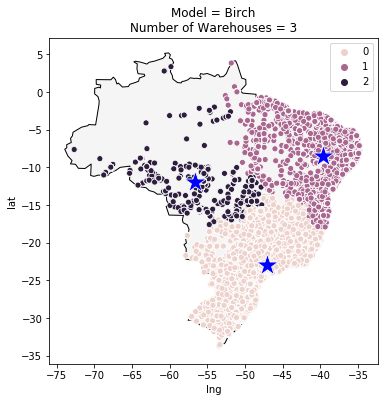

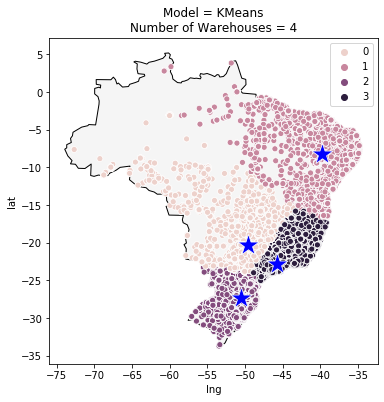

...

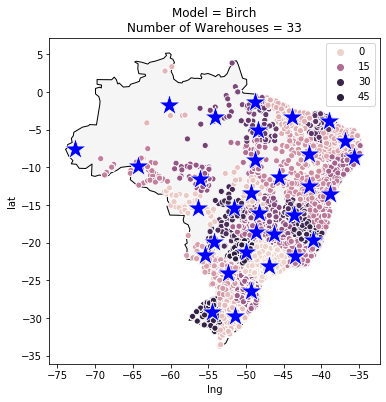

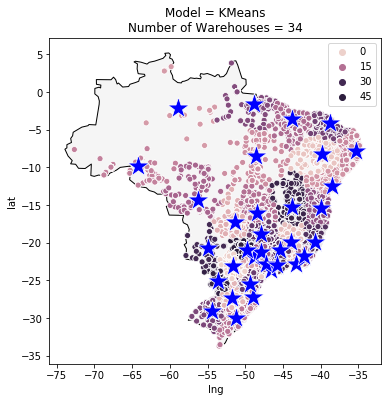

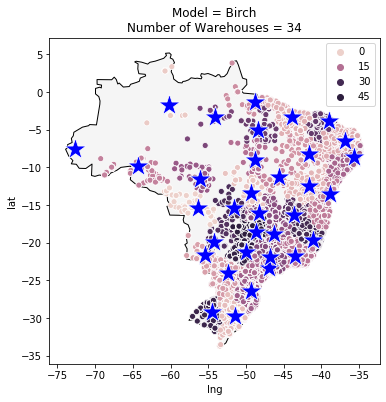

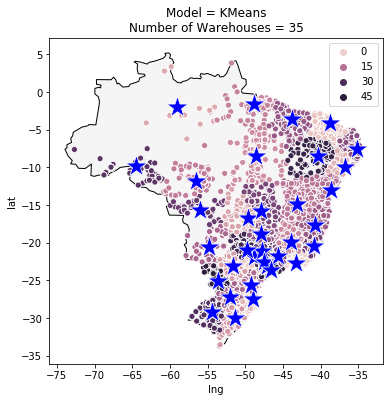

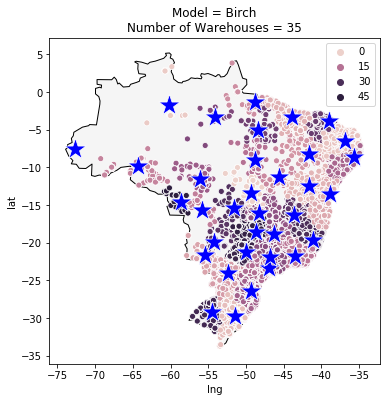

In [0]:
models=[
    KMeans,
#     SpectralClustering,
#     AgglomerativeClustering,
    Birch]
n_clust=range(2,36)

for clust in n_clust:
    for mdl in models:
        start=time()
        model=mdl(n_clusters=clust)
        model.fit(lat_lng)
        
        ax=brazil.plot(color='whitesmoke',edgecolor='black',figsize=(6,6))
        sns.scatterplot(lat_lng['lng'],lat_lng['lat'],hue=model.labels_,ax=ax)
        try:
            sns.scatterplot([i[0] for i in model.cluster_centers_],[i[1] for i in model.cluster_centers_],marker='*',s=500,ax=ax,color='b')
        except:
            for center in range(clust):
                data=lat_lng[model.labels_==center]
                km.fit(data)
                sns.scatterplot([i[0] for i in km.cluster_centers_],[i[1] for i in km.cluster_centers_],marker='*',s=500,ax=ax,color='b')
                
        ax.set_title(f'Model = {model.__class__.__name__}\nNumber of Warehouses = {clust}')
        
        pickle.dump(model,open(f'{model.__class__.__name__}_cl_{clust}.mdl','wb'))
        plt.savefig(f'{model.__class__.__name__}_cl_{clust}.jpg')
        
        print(f'.... Finished Clustering for {clust} warehouses using {model.__class__.__name__}')
        print(f'.. Time for clustering = {round(time()-start,3)}s')
        
        print(f'__labels and member quantity in each cluster__'.upper())
        print(pd.Series(model.labels_).value_counts())

#### DBSCAN

.... Finished Clustering for 14 warehouses using DBSCAN
.. Time for clustering = 259.829s
LABELS AND MEMBER QUANTITY IN EACH CLUSTER)
-1     206667
 3       8399
 1       2158
 7       2115
 8       1916
 2       1724
 0       1569
 5       1555
 9       1478
 6       1275
 10      1271
 11      1246
 4       1200
 12      1037
dtype: int64


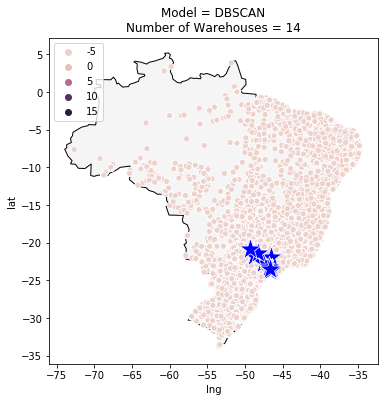

In [0]:
start=time()

kms_per_rad = 6371.0088
epsilon = 1/kms_per_rad

model = DBSCAN(eps=epsilon,min_samples=1000,metric='haversine',algorithm='ball_tree')
model.fit(lat_lng)
clus=pd.Series(model.labels_).unique()
clust=len(clus)

ax=brazil.plot(color='whitesmoke',edgecolor='black',figsize=(6,6))
sns.scatterplot(lat_lng['lng'],lat_lng['lat'],hue=model.labels_,ax=ax)
try:
    sns.scatterplot([i[0] for i in model.cluster_centers_],[i[1] for i in model.cluster_centers_],marker='*',s=500,ax=ax,color='b')
except:
    for center in clus:
        data=lat_lng[model.labels_==center]
        km.fit(data)
        sns.scatterplot([i[0] for i in km.cluster_centers_],[i[1] for i in km.cluster_centers_],marker='*',s=500,ax=ax,color='b')
ax.set_title(f'Model = {model.__class__.__name__}\nNumber of Warehouses = {clust}')

pickle.dump(model,open(f'{model.__class__.__name__}_cl_{clust}.mdl','wb'))
plt.savefig(f'{model.__class__.__name__}_cl_{clust}.jpg')

print(f'.... Finished Clustering for {clust} warehouses using {model.__class__.__name__}')
print(f'.. Time for clustering = {round(time()-start,3)}s')

print(f'labels and member quantity in each cluster)'.upper())
print(pd.Series(model.labels_).value_counts())

#### HDBSCAN

.... Finished Clustering for 41 warehouses using HDBSCAN
.. Time for clustering = 564.586s
LABELS AND MEMBER QUANTITY IN EACH CLUSTER)
-1     81041
 21    15510
 5     12929
 24    10554
 30     8499
 6      7689
 14     6913
 8      5265
 16     4648
 27     4572
 0      4445
 39     4246
 3      3958
 15     3956
 37     3859
 2      3835
 34     3810
 26     3782
 35     3208
 4      3204
 18     3151
 32     3130
 17     2789
 10     2504
 13     2257
 31     2001
 36     1956
 33     1800
 12     1732
 19     1669
 7      1597
 38     1553
 23     1529
 9      1493
 22     1398
 29     1394
 20     1233
 11     1179
 28     1152
 25     1122
 1      1048
dtype: int64


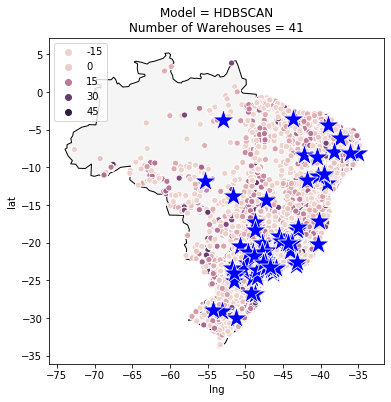

In [0]:
start=time()

model = HDBSCAN(min_cluster_size=1000, gen_min_span_tree=True,metric='haversine')
model.fit(lat_lng)
clus=pd.Series(model.labels_).unique()
clust=len(clus)

ax=brazil.plot(color='whitesmoke',edgecolor='black',figsize=(6,6))
sns.scatterplot(lat_lng['lng'],lat_lng['lat'],hue=model.labels_,ax=ax)
try:
    sns.scatterplot([i[0] for i in model.cluster_centers_],[i[1] for i in model.cluster_centers_],marker='*',s=500,ax=ax,color='b')
except:
    for center in clus:
        data=lat_lng[model.labels_==center]
        km.fit(data)
        sns.scatterplot([i[0] for i in km.cluster_centers_],[i[1] for i in km.cluster_centers_],marker='*',s=500,ax=ax,color='b')
ax.set_title(f'Model = {model.__class__.__name__}\nNumber of Warehouses = {clust}')

pickle.dump(model,open(f'{model.__class__.__name__}_cl_{clust}.mdl','wb'))
plt.savefig(f'{model.__class__.__name__}_cl_{clust}.jpg')

print(f'.... Finished Clustering for {clust} warehouses using {model.__class__.__name__}')
print(f'.. Time for clustering = {round(time()-start,3)}s')

print(f'labels and member quantity in each cluster)'.upper())
print(pd.Series(model.labels_).value_counts())

#### Iterative KMeans
*The idea is to keep dividing the area into clusters using KMeans(n_clusters=2) while an area with more than 50000 sample exist.*

.... Finished Clustering for 2 warehouses (iteration#1) using KMeans
.. Time for clustering = 1.052s
0    218870
1     14740
dtype: int64
Building New Cluster in Cluster#0
.... Finished Clustering for 3 warehouses (iteration#2) using KMeans
.. Time for clustering = 12.563s
2    181551
3     37319
1     14740
dtype: int64
Building New Cluster in Cluster#2
.... Finished Clustering for 4 warehouses (iteration#3) using KMeans
.. Time for clustering = 11.804s
5    142091
4     39460
3     37319
1     14740
dtype: int64
Building New Cluster in Cluster#5
.... Finished Clustering for 5 warehouses (iteration#4) using KMeans
.. Time for clustering = 11.246s
6    109083
4     39460
3     37319
7     33008
1     14740
dtype: int64
Building New Cluster in Cluster#6
.... Finished Clustering for 6 warehouses (iteration#5) using KMeans
.. Time for clustering = 10.945s
8    83914
4    39460
3    37319
7    33008
9    25169
1    14740
dtype: int64
Building New Cluster in Cluster#8
.... Finished Clusteri

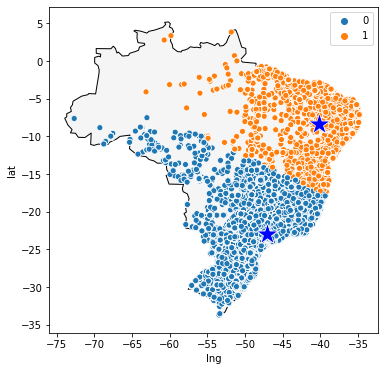

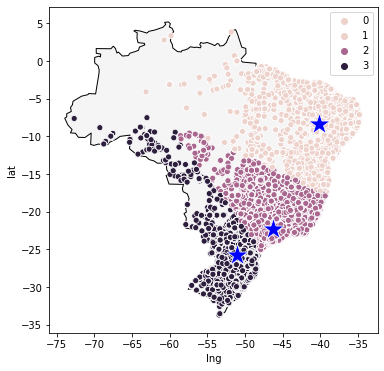

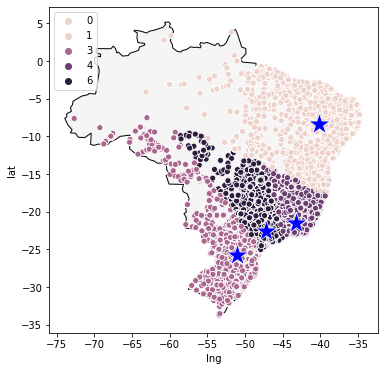

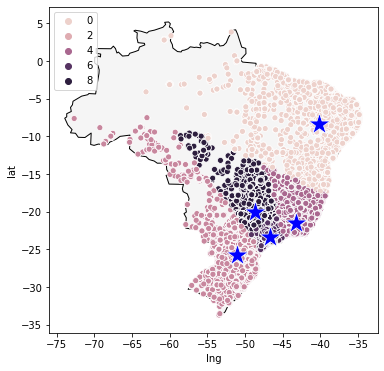

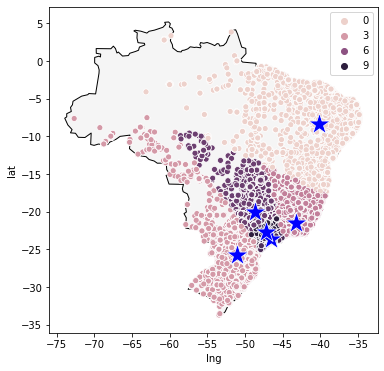

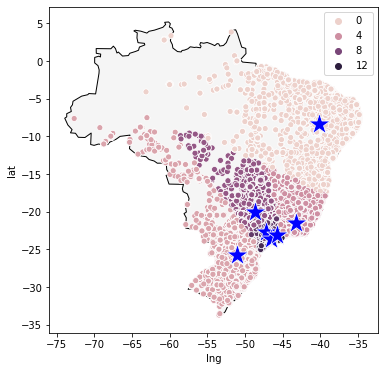

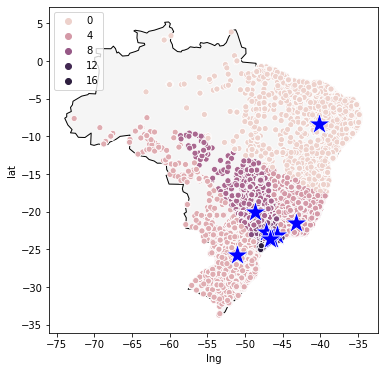

In [15]:
start=time()
n=2
km=KMeans(n_clusters=n,random_state=42)
km.fit(lat_lng)

labels=pd.Series(km.labels_)
val_counts=labels.value_counts()
centroids=km.cluster_centers_

iterr,add,clusters=1,0,[n]
pickle.dump(labels,open(f'km3_iter{iterr}.label','wb'))
while val_counts.max()>50000:
    
    add+=n
    
    print(f'.... Finished Clustering for {labels.nunique()} warehouses (iteration#{iterr}) using {km.__class__.__name__}')
    print(f'.. Time for clustering = {round(time()-start,3)}s')
    print(val_counts)
    start=time()

    ax=brazil.plot(color='whitesmoke',edgecolor='black',figsize=(6,6))
    sns.scatterplot(lat_lng['lng'],lat_lng['lat'],hue=labels,ax=ax)
    sns.scatterplot([i[0] for idx,i in enumerate(centroids) if idx in labels.unique()],[i[1] for idx,i in enumerate(centroids) if idx in labels.unique()],marker='*',s=500,ax=ax,color='b')

    plt.savefig(f'km3_iter{iterr}.jpg')
    pickle.dump(km,open(f'km3_iter{iterr}.mdl','wb'))

    to_fit=val_counts.index[0]

    print(f'Building New Cluster in Cluster#{to_fit}')
    km.fit(lat_lng[labels==to_fit])
    centroids=np.append(centroids,km.cluster_centers_,axis=0)

    for idx,new_label in zip(labels[labels==to_fit].index,km.labels_):
        labels[idx]=new_label+add
    pickle.dump(labels,open(f'km3_iter{iterr}.label','wb'))
    pickle.dump(centroids,open(f'km3_iter{iterr}.ctr','wb'))

    val_counts=labels.value_counts()

    iterr+=1
    clusters.append(labels.nunique())
    if clusters[-1]==clusters[-2]:
        print('Cluster quantity not increasing. Stopping iteration.')
        break

print(f'.... Finished Clustering for {labels.nunique()} warehouses (iteration#{iterr}) using {km.__class__.__name__}')
print(f'.. Time for clustering = {round(time()-start,3)}s')
print(val_counts)
ax=brazil.plot(color='whitesmoke',edgecolor='black',figsize=(6,6))
sns.scatterplot(lat_lng['lng'],lat_lng['lat'],hue=labels,ax=ax)
sns.scatterplot([i[0] for idx,i in enumerate(centroids) if idx in labels.unique()],[i[1] for idx,i in enumerate(centroids) if idx in labels.unique()],marker='*',s=500,ax=ax,color='b')

pickle.dump(centroids,open(f'km3_iter{iterr}.ctr','wb'))
pickle.dump(labels,open(f'km3_iter{iterr}.label','wb'))
plt.savefig(f'km3_iter{iterr}.jpg')
pickle.dump(km,open(f'km3_iter{iterr}.mdl','wb'))

#### Iterative Birch
*The idea is to keep dividing the area into clusters using Birch(n_clusters=2) while an area with more than 50000 sample exist.*

.... Finished Clustering for 2 warehouses (iteration#1) using Birch
.. Time for clustering = 11.049s
0    219341
1     14269
dtype: int64
Building New Cluster in Cluster#0
.... Finished Clustering for 3 warehouses (iteration#2) using Birch
.. Time for clustering = 20.829s
2    217498
1     14269
3      1843
dtype: int64
Building New Cluster in Cluster#2
.... Finished Clustering for 4 warehouses (iteration#3) using Birch
.. Time for clustering = 20.783s
5    170494
4     47004
1     14269
3      1843
dtype: int64
Building New Cluster in Cluster#5
.... Finished Clustering for 5 warehouses (iteration#4) using Birch
.. Time for clustering = 18.974s
6    138357
4     47004
7     32137
1     14269
3      1843
dtype: int64
Building New Cluster in Cluster#6
.... Finished Clustering for 6 warehouses (iteration#5) using Birch
.. Time for clustering = 14.443s
9    129588
4     47004
7     32137
1     14269
8      8769
3      1843
dtype: int64
Building New Cluster in Cluster#9
.... Finished Cluste

/usr/local/lib/python3.6/dist-packages/sklearn/cluster/birch.py:627: ConvergenceWarning: Number of subclusters found (1) by Birch is less than (2). Decrease the threshold.
  % (len(centroids), self.n_clusters), ConvergenceWarning)


Cluster quantity not increasing. Stopping iteration.
.... Finished Clustering for 11 warehouses (iteration#11) using KMeans
.. Time for clustering = 13.565s
20    97982
4     47004
7     32137
1     14269
11    13221
13     8967
8      8769
19     5098
15     2299
17     2021
3      1843
dtype: int64


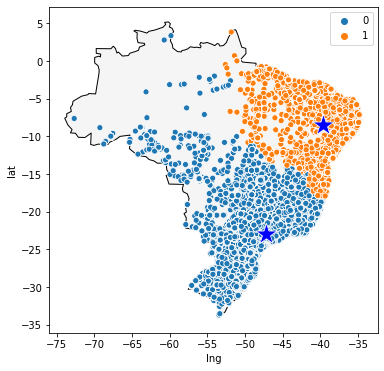

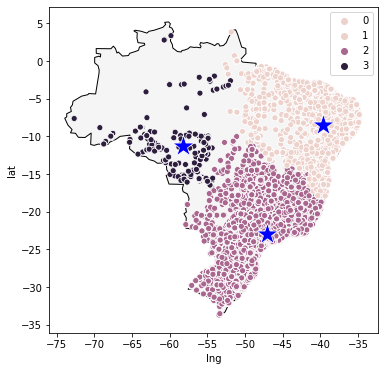

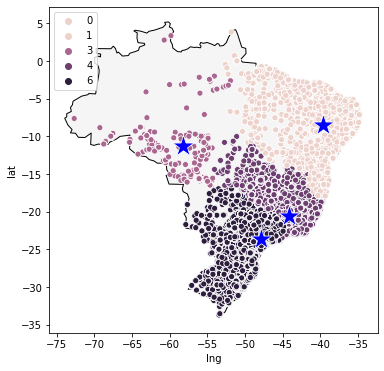

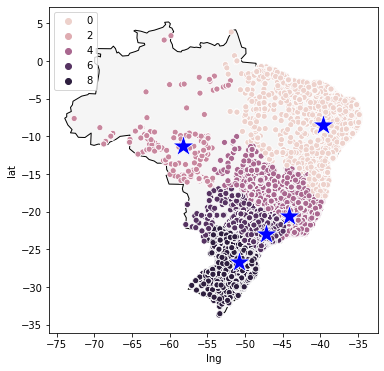

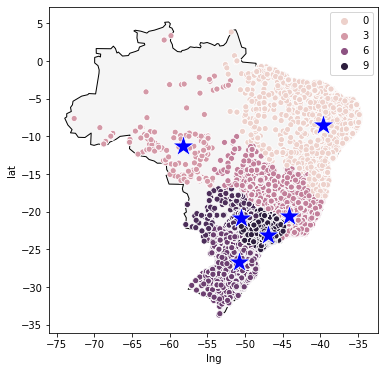

...

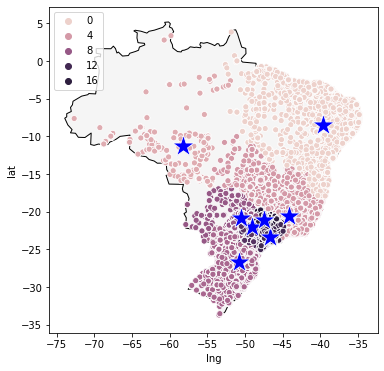

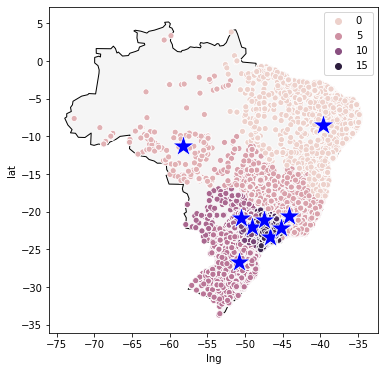

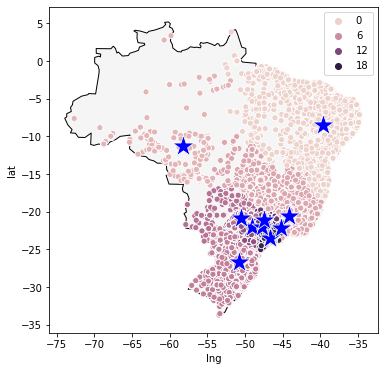

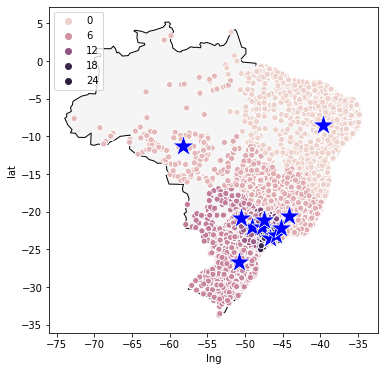

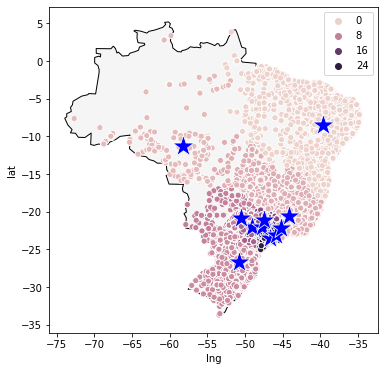

In [0]:
start=time()
n=2

birch=Birch(n_clusters=n)
birch.fit(lat_lng)

km=KMeans(n_clusters=1)

labels=pd.Series(birch.labels_)
val_counts=labels.value_counts()

iterr,add,clusters=1,0,[n]
pickle.dump(labels,open(f'birch3_iter{iterr}.label','wb'))
while val_counts.max()>50000:
    add+=n
    print(f'.... Finished Clustering for {labels.nunique()} warehouses (iteration#{iterr}) using {birch.__class__.__name__}')
    print(f'.. Time for clustering = {round(time()-start,3)}s')
    print(val_counts)
    start=time()

    ax=brazil.plot(color='whitesmoke',edgecolor='black',figsize=(6,6))
    sns.scatterplot(lat_lng['lng'],lat_lng['lat'],hue=labels,ax=ax)

    for center in labels.unique():
        data=lat_lng[labels==center]
        km.fit(data)
        sns.scatterplot([i[0] for i in km.cluster_centers_],[i[1] for i in km.cluster_centers_],marker='*',s=500,ax=ax,color='b')

    plt.savefig(f'birch3_iter{iterr}.jpg')
    pickle.dump(km,open(f'birch3_iter{iterr}.mdl','wb'))

    to_fit=val_counts.index[0]

    print(f'Building New Cluster in Cluster#{to_fit}')
    birch.fit(lat_lng[labels==to_fit])

    for idx,new_label in zip(labels[labels==to_fit].index,birch.labels_):
        labels[idx]=new_label+add
    pickle.dump(labels,open(f'birch3_iter{iterr}.label','wb'))
    pickle.dump(centroids,open(f'birch3_iter{iterr}.ctr','wb'))

    val_counts=labels.value_counts()
    iterr+=1
    clusters.append(labels.nunique())
    if clusters[-1]==clusters[-2]:
        print('Cluster quantity not increasing. Stopping iteration.')
        break
    
print(f'.... Finished Clustering for {labels.nunique()} warehouses (iteration#{iterr}) using {km.__class__.__name__}')
print(f'.. Time for clustering = {round(time()-start,3)}s')
print(val_counts)
ax=brazil.plot(color='whitesmoke',edgecolor='black',figsize=(6,6))
sns.scatterplot(lat_lng['lng'],lat_lng['lat'],hue=labels,ax=ax)
for center in labels.unique():
    data=lat_lng[labels==center]
    km.fit(data)
    sns.scatterplot([i[0] for i in km.cluster_centers_],[i[1] for i in km.cluster_centers_],marker='*',s=500,ax=ax,color='b')

pickle.dump(centroids,open(f'birch3_iter{iterr}.ctr','wb'))
pickle.dump(labels,open(f'birch3_iter{iterr}.label','wb'))
plt.savefig(f'birch3_iter{iterr}.jpg')
pickle.dump(km,open(f'birch3_iter{iterr}.mdl','wb'))

## Machine Learning Conclusion

To conclude each clustering method. DBSCAN and HDBSCAN entirely doesn't work on the data due to the density of data in Sao Paulo. KMeans and Birch seems to divides the area quite nicely on the map but doesn't divide the area into the same density due to the same reason as the previous clustering methods. 

To overcome this problem, an idea to divide the area only when it's very dense was proposed by splitting the data over and over again until it's most dense area has less than 50,000 sample. However, this doesn't work using Birch due to the model failing to split the data further after 10 iterations, leaving the most dense are with 97,982 samples. On the other hand, with KMeans, the model was able to split repeatedly and developed 4 warehouse points for Sao Paulo alone and 7 warehoeses for the main island of Brazil.